## High School Segregation Trends 2014 - 2017
**This notebook explores changes in student body racial comopositions for public high schools in North Carolina.**

* Using NO racial composition data, can we predict the minority percentage for a public high school?
* What are the differences between highly segregated majority and minority schools?
* The North Carolina Educational Attainment Data Repository for Machine Learning is located on Github at: https://github.com/jakemdrew/EducationDataNC

In [1]:
#import required Libraries
import pandas as pd
import numpy as np

#The 'path' variable may also be a URL pointing to the proper raw file path on github: 
#path="https://raw.githubusercontent.com/jakemdrew/EducationDataNC/master/2017/Machine%20Learning%20Datasets/PublicHighSchools2017_ML.csv"

#Read in 4 years worth of public high school data
path="C:/Users/Jake/Documents/GitHub/EducationDataNC/2017/Machine Learning Datasets/PublicHighSchools2017_ML.csv"
schData2017=pd.read_csv(path, low_memory=False)

path="C:/Users/Jake/Documents/GitHub/EducationDataNC/2016/Machine Learning Datasets/PublicHighSchools2016_ML.csv"
schData2016=pd.read_csv(path, low_memory=False)

path="C:/Users/Jake/Documents/GitHub/EducationDataNC/2015/Machine Learning Datasets/PublicHighSchools2015_ML.csv"
schData2015=pd.read_csv(path, low_memory=False)

path="C:/Users/Jake/Documents/GitHub/EducationDataNC/2014/Machine Learning Datasets/PublicHighSchools2014_ML.csv"
schData2014=pd.read_csv(path, low_memory=False)

In [2]:
#Data preparation

#Create a response variable for the majority percentage
schData2017["MajorityPct"] = 1 - schData2017['MinorityPct']
schData2016["MajorityPct"] = 1 - schData2016['MinorityPct']
schData2015["MajorityPct"] = 1 - schData2015['MinorityPct']
schData2014["MajorityPct"] = 1 - schData2014['MinorityPct']

#Create a school year variable for each file
schData2017["SchoolYear"] = 2017
schData2016["SchoolYear"] = 2016
schData2015["SchoolYear"] = 2015
schData2014["SchoolYear"] = 2014

#Create segregation categories for each year  
schData2017.loc[(schData2017['MajorityPct'] >= 0.80),'Segregated'] = '>= 80% White'
schData2017.loc[(schData2017['MajorityPct'] >= 0.90),'Segregated'] = '>= 90% White'
schData2017.loc[(schData2017['MinorityPct'] >= 0.80),'Segregated'] = '>= 80% Minority'
schData2017.loc[(schData2017['MinorityPct'] >= 0.90),'Segregated'] = '>= 90% Minority'
schData2017.loc[(schData2017['MinorityPct'] < 0.80) & (schData2017['MajorityPct'] < 0.80),'Segregated'] = '< 80% Segregated'

schData2016.loc[(schData2016['MajorityPct'] >= 0.80),'Segregated'] = '>= 80% White'
schData2016.loc[(schData2016['MajorityPct'] >= 0.90),'Segregated'] = '>= 90% White'
schData2016.loc[(schData2016['MinorityPct'] >= 0.80),'Segregated'] = '>= 80% Minority'
schData2016.loc[(schData2016['MinorityPct'] >= 0.90),'Segregated'] = '>= 90% Minority'
schData2016.loc[(schData2016['MinorityPct'] < 0.80) & (schData2016['MajorityPct'] < 0.80),'Segregated'] = '< 80% Segregated'

schData2015.loc[(schData2015['MajorityPct'] >= 0.80),'Segregated'] = '>= 80% White'
schData2015.loc[(schData2015['MajorityPct'] >= 0.90),'Segregated'] = '>= 90% White'
schData2015.loc[(schData2015['MinorityPct'] >= 0.80),'Segregated'] = '>= 80% Minority'
schData2015.loc[(schData2015['MinorityPct'] >= 0.90),'Segregated'] = '>= 90% Minority'
schData2015.loc[(schData2015['MinorityPct'] < 0.80) & (schData2015['MajorityPct'] < 0.80),'Segregated'] = '< 80% Segregated'

schData2014.loc[(schData2014['MajorityPct'] >= 0.80),'Segregated'] = '>= 80% White'
schData2014.loc[(schData2014['MajorityPct'] >= 0.90),'Segregated'] = '>= 90% White'
schData2014.loc[(schData2014['MinorityPct'] >= 0.80),'Segregated'] = '>= 80% Minority'
schData2014.loc[(schData2014['MinorityPct'] >= 0.90),'Segregated'] = '>= 90% Minority'
schData2014.loc[(schData2014['MinorityPct'] < 0.80) & (schData2014['MajorityPct'] < 0.80),'Segregated'] = '< 80% Segregated'

#Create a combined dataset for reporting trends 
schData2014_2017 = pd.concat([schData2017,schData2016,schData2015,schData2014], axis=0, join='inner', ignore_index=True)

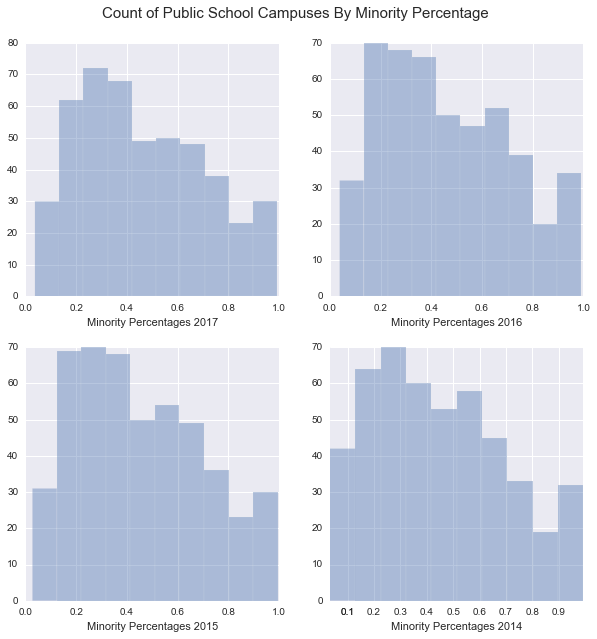

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Make an axis for each chart
fig, axs = plt.subplots(figsize=(10,10), ncols=2, nrows=2)

# The amount of space above titles
y_title_margin = 1.2
plt.suptitle("Count of Public School Campuses By Minority Percentage", y = .95, fontsize=15)


# Plot the 2017 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2017['MinorityPct'], kde=False, ax=axs[0][0])
hst.set_xlabel("Minority Percentages 2017")
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

# Plot the 2016 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2016['MinorityPct'], kde=False, ax=axs[0][1])
hst.set_xlabel("Minority Percentages 2016")
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])


# Plot the 2015 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2015['MinorityPct'], kde=False, ax=axs[1][0])
hst.set_xlabel("Minority Percentages 2015") 
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

# Plot the 2014 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2014['MinorityPct'], kde=False, ax=axs[1][1])
hst.set_xlabel("Minority Percentages 2014") 
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

plt.show()
#See:  https://gist.github.com/dyerrington/dac39db54161dafc9359995924413a12

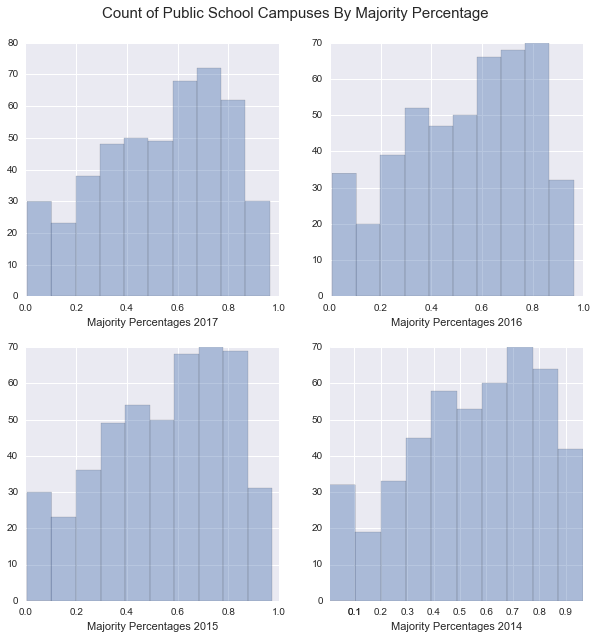

In [4]:
#import seaborn as sns
#import matplotlib.pyplot as plt

# Make an axis for each chart
fig, axs = plt.subplots(figsize=(10,10), ncols=2, nrows=2)

# The amount of space above titles
y_title_margin = 1.2
plt.suptitle("Count of Public School Campuses By Majority Percentage", y = .95, fontsize=15)


# Plot the 2017 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2017['MajorityPct'], kde=False, ax=axs[0][0])
hst.set_xlabel("Majority Percentages 2017") 
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

# Plot the 2016 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2016['MajorityPct'], kde=False, ax=axs[0][1])
hst.set_xlabel("Majority Percentages 2016")
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])


# Plot the 2015 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2015['MajorityPct'], kde=False, ax=axs[1][0])
hst.set_xlabel("Majority Percentages 2015") 
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

# Plot the 2014 Minority racial compositions
sns.set(color_codes=True)
hst = sns.distplot(schData2014['MajorityPct'], kde=False, ax=axs[1][1])
hst.set_xlabel("Majority Percentages 2014")
_ = plt.xticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.10])

plt.show()
#See:  https://gist.github.com/dyerrington/dac39db54161dafc9359995924413a12

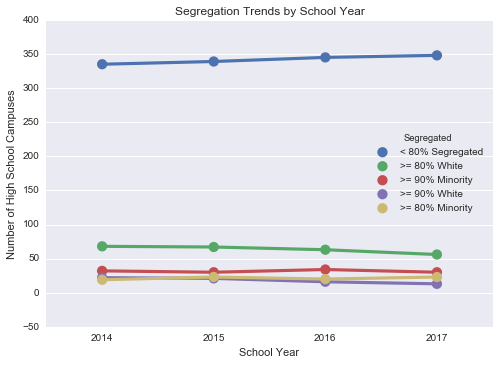

In [17]:
#Look at segregation categories by year
vc = schData2014_2017.groupby('SchoolYear')['Segregated'].value_counts()
SegDataBySchoolYear = pd.DataFrame(data={'SchoolYear':vc.index.get_level_values(0)
                                        ,'Segregated':vc.index.get_level_values(1)
                                        ,'ValueCounts':vc.values})

sns.set_style("darkgrid")
pplot = sns.pointplot(x='SchoolYear',y='ValueCounts', hue='Segregated', data=SegDataBySchoolYear)
pplot.set_ylabel("Number of High School Campuses")
pplot.set_xlabel("School Year")
pplot.set_title("Segregation Trends by School Year")

plt.show()

## Classifying Highly Majority and Minority Segregated Schools
* As shown above, public schools may be highly minority or majority segregated.
* First, we build and test a model to distinguish between public schools which are >= 80% minority or majority segregated.
* The purpose for such a model is to deterine where the greatest differences reside within the data.

In [6]:
#Create a response variable for the majority percentage
schData2017["MajorityPct"] = 1 - schData2017['MinorityPct']

#Isolate the highly majority and minority segregated high schools
schData = schData2017[(schData2017['Segregated'] != '< 80% Segregated')]
schData.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122 entries, 3 to 469
Columns: 406 entries, student_num to Segregated
dtypes: float64(323), int64(82), object(1)
memory usage: 387.9+ KB


In [18]:
#Create a highly segregated flag where 0 = > 80% majority campuses and 1 = > 80% minority campuses 
schData.loc[(schData['MajorityPct'] >= 0.80),'HighlySegregatedTypeCd'] = 0
schData.loc[(schData['MinorityPct'] >= 0.80),'HighlySegregatedTypeCd'] = 1

#Check our results 
schData['HighlySegregatedTypeCd'].value_counts()

0.0    69
1.0    53
Name: HighlySegregatedTypeCd, dtype: int64

In [8]:
#Delete all racial composition data from our dataset. 
#raceCompositionFields = ['Indian Male','Asian Male','Hispanic Male','Black Male','White Male'
#                         ,'Pacific Island Male','Pacific Island Female','Two or  More Male','Two or  More Female'
#                         ,'Pacific Island','Majority_Minority','White_Pct','Two or More','MajorityPct']

RaceCols = schData.columns[(schData.columns.str.lower().str.contains('indian')) | 
                           (schData.columns.str.lower().str.contains('asian')) |
                           (schData.columns.str.lower().str.contains('hispanic')) |
                           (schData.columns.str.lower().str.contains('black')) |
                           (schData.columns.str.lower().str.contains('white')) |
                           (schData.columns.str.lower().str.contains('pacificisland')) |
                           (schData.columns.str.lower().str.contains('twoormore')) |
                           (schData.columns.str.lower().str.contains('pacific island')) |
                           (schData.columns.str.lower().str.contains('two or  more')) |
                           (schData.columns.str.lower().str.contains('majority')) |
                           (schData.columns.str.lower().str.contains('minority')) |
                           (schData.columns.str.lower().str.contains('segregated'))]
RaceCols

Index([u'ACTCompositeScore_UNCMin_AmericanIndian',
       u'ACTMath_ACTBenchmark_AmericanIndian',
       u'ACTSubtests_BenchmarksMet_AmericanIndian',
       u'ACTWorkKeys_SilverPlus_AmericanIndian',
       u'ACTWriting_ACTBenchmark_AmericanIndian',
       u'EOCBiology_CACR_AmericanIndian', u'EOCEnglish2_CACR_AmericanIndian',
       u'EOCMathI_CACR_AmericanIndian', u'EOCSubjects_CACR_AmericanIndian',
       u'GraduationRate_4yr_AmericanIndian',
       u'GraduationRate_5yr_AmericanIndian', u'ACTCompositeScore_UNCMin_Asian',
       u'ACTSubtests_BenchmarksMet_Asian', u'ACTWorkKeys_SilverPlus_Asian',
       u'ACTWriting_ACTBenchmark_Asian', u'EOCBiology_CACR_Asian',
       u'EOCEnglish2_CACR_Asian', u'EOCMathI_CACR_Asian',
       u'EOCSubjects_CACR_Asian', u'GraduationRate_4yr_Asian',
       u'GraduationRate_5yr_Asian', u'ACTCompositeScore_UNCMin_Black',
       u'ACTEnglish_ACTBenchmark_Black', u'ACTMath_ACTBenchmark_Black',
       u'ACTReading_ACTBenchmark_Black', u'ACTScience_ACTBenchmar

In [9]:
# create x explanatory and y response variables for regression
Y_HighlySegregatedTp = schData['HighlySegregatedTypeCd'] 
Y = Y_HighlySegregatedTp

#Delete all racial composition data from our dataset.
X_highSchools = schData.drop(RaceCols, axis=1)

#inspect data 
X_highSchools.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122 entries, 3 to 469
Columns: 310 entries, student_num to SchoolYear
dtypes: float64(228), int64(82)
memory usage: 296.4 KB


## Classifier Evaluation
* The following function performs cross validation using cross_validate() for classification   
  estimators and returns accuracy, precision, recall, f1 score, and a confusion matrix for each model.

In [10]:
from sklearn.model_selection import cross_validate

def EvaluateClassifierEstimator2(classifierEstimator, X, y, cv):
    
    #Perform cross validation 
    from sklearn.model_selection import cross_val_predict
    predictions = cross_val_predict(classifierEstimator, X_highSchools, Y, cv=cv)
    
    #model evaluation 
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
    
    #pass true test set values and predictions to classification_report
    classReport = classification_report(Y,predictions)
    confMat = confusion_matrix(Y,predictions)
    acc = accuracy_score(Y,predictions)
    
    print classReport
    print confMat
    print acc

# Classification of Segregated Campuses 
** Here we use the best features uncovered by recursive feature elimination to create a final model with optimized grid search parameters and scale the data to perform feature importance analisys.**

** The following steps are performed: **

1. Use recursive feature elimination to select the best features for predicting highly majority segregated schools.
2. Create a pipeline to scale the training data then perform logistic regression.
3. Create logistic regression parameters to test within the pipeline.
4. Use a grid search to find the best parameters based on classification accuracy.
5. Perform 10-fold cross validation and look at individual fold performance.
6. Look at the classification report, confusion_matrix, and accuracy_score from sklearn.metrics for detailed performance analysis.

In [38]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ShuffleSplit

#Divide data into test and training splits
cv = ShuffleSplit(n_splits=10, test_size=0.10, random_state=0)

#Use Logistic Regression and recursive feature elimination to get the best features for our model
classifierEst = LogisticRegression()

rfecv = RFECV(estimator=classifierEst, step=1, cv=cv, scoring='accuracy')
X_BestFeatures = rfecv.fit_transform(X_highSchools, Y)

#create a pipeline to scale all of the data and perform logistic regression during each grid search step.
pipe = make_pipeline(StandardScaler(), LogisticRegression())

# Define a range of hyper parameters for grid search
parameters = { 'logisticregression__penalty':['l2']
              ,'logisticregression__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
              ,'logisticregression__class_weight': ['balanced','none']
              ,'logisticregression__random_state': [0]
              ,'logisticregression__solver': ['lbfgs']
              ,'logisticregression__max_iter':[100,500]
             }

#Perform the grid search using accuracy as a metric during cross validation.
grid = GridSearchCV(pipe, parameters, cv=cv, scoring='accuracy')

#Use the best features from recursive feature elimination during the grid search
grid.fit(X_BestFeatures, Y)

#display the best pipeline model identified during the grid search
grid.best_estimator_

Pipeline(memory=None,
     steps=[('standardscaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('logisticregression', LogisticRegression(C=0.1, class_weight='none', dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=0, solver='lbfgs', tol=0.0001,
          verbose=0, warm_start=False))])

In [39]:
EvaluateClassifierEstimator2(grid.best_estimator_, X_BestFeatures, Y, 10)

             precision    recall  f1-score   support

        0.0       0.96      0.96      0.96        69
        1.0       0.94      0.94      0.94        53

avg / total       0.95      0.95      0.95       122

[[66  3]
 [ 3 50]]
0.9508196721311475


## Looking at RFECV Feature Importance after using a Pipeline
**Here we look at the most predictive features selected during recursive feature elimination. The features are ranked based on importance using coefficients from the top performing pipeline model identified above.**

In [44]:
#Load the model's coefficient weights and feature names into a dataframe sorted by weights
weights = grid.best_estimator_.named_steps['logisticregression'].coef_.ravel()
feature_names = X_highSchools.columns.values[rfecv.get_support(indices=True)]

linreg_ft_imp_df = pd.DataFrame({'feature_names':feature_names, 'weights':weights,
                                 'absolute_weights': np.abs(weights)})
linreg_ft_imp_df.sort_values(by='absolute_weights', inplace=True, ascending=False )

#Print out all the missing value rows
pd.set_option('display.max_rows', 1000)

linreg_ft_imp_df = linreg_ft_imp_df[linreg_ft_imp_df.feature_names != 'SchoolYear']

model_features = len(linreg_ft_imp_df.index)
print('Total Model Features: ' + str(model_features))

#Print all of the features selected by the model 
linreg_ft_imp_df

Total Model Features: 75


,absolute_weights,feature_names,weights
60,0.482811,lea_short_susp_per_c_num,0.482811
1,0.482206,lea_avg_student_num,0.482206
55,0.472556,lea_sat_avg_score_num,-0.472556
65,0.322193,pct_eds,0.322193
59,0.259118,short_susp_per_c_num,0.259118
63,0.255651,nbpts_num,-0.255651
5,0.233215,SPG Score,-0.233215
21,0.228734,ACTWorkKeys_SilverPlus_Female,-0.228734
9,0.226149,ACT WorkKeys Score,-0.226149
46,0.210721,GraduationRate_5yr_SWD,-0.210721


Total Model Features: 75


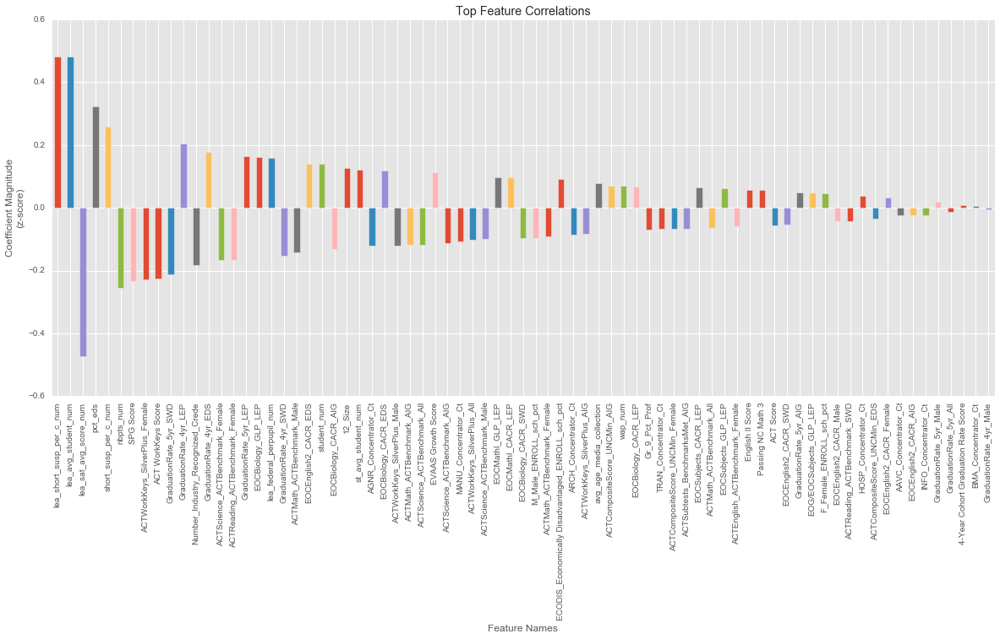

In [45]:
#Get the top 75 coefficients
wt_plt_df = linreg_ft_imp_df.head(75)

model_features = len(wt_plt_df.index)
print('Total Model Features: ' + str(model_features))

# Examine categorical variables of interest  
import matplotlib.pyplot as plt
%matplotlib inline

#Plot the model's feature importances
# REFERENCE:  Eric Larson, https://github.com/eclarson/DataMiningNotebooks
plt.style.use('ggplot')

weights = pd.Series(wt_plt_df['weights'].values,index=wt_plt_df['feature_names'])
ax = weights.plot(kind='bar', figsize=(20,8))

ax.set_title("Top Feature Correlations")
ax.set_ylabel("Coefficient Magnitude\n(z-score)")
ax.set_xlabel("Feature Names")
plt.show()

## Missing Values / Imputation Analysis
* During imputation, all missing values were set to zero.  
* It is important to understand the impact of missing values on the features selected by the model
* Here we read in the original school datasets that are not imputed, review only the fields selected
  by the model, and count the missing values for each of the fields. 

In [41]:
#Read in the non-imputed school dataset
path="C:/Users/Jake/Documents/GitHub/EducationDataNC/2017/School Datasets/PublicHighSchools2017.csv"
sch_NonImputed=pd.read_csv(path, low_memory=False)

#Get only the feature names selected by the model
sch_NonImputed = sch_NonImputed[wt_plt_df['feature_names']]

model_features = len(wt_plt_df.index)
print('Total Model Features: ' + str(model_features))

Total Model Features: 75


In [43]:
#Print out all the missing value rows
pd.set_option('display.max_rows', 1000)

print('\r\n*********Missing Values for Features' + 
      ' Selected By the Top Performing Model*************************')

total_records = len(sch_NonImputed.index)
print('Total Records: ' + str(total_records))

#Check for Missing values 
missing_values = sch_NonImputed.isnull().sum().reset_index()
missing_values.columns = ['Variable Name', 'Number Missing Values']
#missing_values = missing_values[missing_values['Number Missing Values'] > 0] 
missing_values['Pct Missing'] = missing_values['Number Missing Values'] / total_records

model_features = len(missing_values.index)
print('Total Model Features: ' + str(model_features))

missing_values


*********Missing Values for Features Selected By the Top Performing Model*************************
Total Records: 470
Total Model Features: 75


,Variable Name,Number Missing Values,Pct Missing
0,lea_short_susp_per_c_num,0,0.000000
1,lea_avg_student_num,0,0.000000
2,lea_sat_avg_score_num,1,0.002128
3,pct_eds,0,0.000000
4,short_susp_per_c_num,0,0.000000
5,nbpts_num,2,0.004255
6,SPG Score,0,0.000000
7,ACTWorkKeys_SilverPlus_Female,108,0.229787
8,ACT WorkKeys Score,89,0.189362
9,GraduationRate_5yr_SWD,24,0.051064


## Comparing Majority and Minority Segregated Public Schools to Non-Segregated Public Schools 2014 - 2017
** Here we plot the model's top 75 most important features for the past four years comparing segregated and non-segregated public school campuses: **

* Model features are ranked by the absolute value of the model's coefficients.  
* Features with the largest differences between majority and minority campuses are shown first. 
* Kernel Density Estimation is used to estimate the probability density function for each significant feature given each population: majority segregated vs. minority segregated.
* Subplots display the past four years of data for each significant feature as well. 
* Each population's mean value is marked with a color-coded a vertical line and value. 
* The mean for public school campuses with < 80% minority and majority populations is plotted as a 
  verticle line in red.
* When data is not available for a particular year, the subplot will be blank. 

In [49]:
def PlotColumnKdeByYears(dataFrames, col):
    
    #set histogram plot preferences
    sns.set(context='notebook', style='darkgrid', font_scale=1.25)
    fig, ax = plt.subplots(figsize=(18,18), ncols=2, nrows=2)
    
    schYear = 2017
    pltRow = 0
    pltCol = 0
    
    for df in dataFrames:
        
        if col not in df.columns:
            continue   
                
        #Plot KDE's for different student body racial compositions 
        kde1 = sns.distplot(df[col].loc[(df["Segregated"] == ">= 80% White")  
                                         |(df["Segregated"] == ">= 90% White")],
                            ax=ax[pltRow][pltCol])
        kde2 = sns.distplot(df[col].loc[(df["Segregated"] == ">= 80% Minority") 
                                        | (df["Segregated"] == ">= 80% Minority")],
                            ax=ax[pltRow][pltCol])
        
        #UNCOMMENT the line below to add a 3rd kde plot for non-segregated schools to each subplot ()
        #kde3 = sns.distplot(df[col].loc[df["Segregated"] == "< 80% Segregated"],
        #                    ax=ax[pltRow][pltCol])

        #Get the mean for each racial composition group
        m1 = df[col].loc[(df["Segregated"] == ">= 80% White")  
                                 |(df["Segregated"] == ">= 90% White")].mean()
        m2 = df[col].loc[(df["Segregated"] == ">= 80% Minority") 
                                 |(df["Segregated"] == ">= 80% Minority")].mean()
        m3 = df[col].loc[df["Segregated"] == "< 80% Segregated"].mean()

        #Add chart labels 
        kde2.set_title(col + " by School Year")
        kde2.set_ylabel('Kernel Density Estimation') 
        kde2.set_xlabel(col + " " + str(schYear)) 
        #kde2.legend([">= 80% White", ">= 80% Minority"]) 
        
        #Use decimal places for percentages
        mMax = np.max([m1,m2,m3])
        dec = 3 if mMax <= 1 else 1
        
        #Find a y location for values of 0.0 using 5% of the max y label value
        ylimMin, ylimMax = ax[pltRow][pltCol].get_ylim()
        
        #Add a verticle line for the < 80% Segregated population mean
        y_i = ylimMax * 0.7 #<--- Control line height so number lables show
        kde2.vlines(m3,0,y_i,linestyles=[(0,(9,3,4,4))],colors='r')
        
        #Label the vline with its actual value
        m3 = np.around(m3, decimals=dec)
        kde2.annotate(s=m3, xy =(m3,y_i + (y_i * .01)), xycoords='data', ha='center')
        
        #Plot the legend before adding the last two verticle lines (no room for 5 entries)
        kde2.legend(["< 80% Mean", ">= 80% White", ">= 80% Minority"])
        
        #Add a verticle line for the >= 80% White Segregated population mean 
        y_i = ylimMax * 0.8 #<--- Control line height so number lables show
        kde1.vlines(m1,0,y_i,linestyles=[(0,(9,3,4,4))],colors='b')
        
        #Label the vline with its actual value
        m1 = np.around(m1, decimals=dec)
        kde1.annotate(s=m1, xy =(m1,y_i + (y_i * .01)), xycoords='data', ha='center')
        
        #Add a verticle line for the >= 80% Minority Segregated population mean 
        y_i = ylimMax * 0.75 #<--- Control line height so number lables show
        kde2.vlines(m2,0,y_i,linestyles=[(0,(9,3,4,4))],colors='g')

        #Label the vline with its actual value
        m2 = np.around(m2, decimals=dec)
        kde2.annotate(s=m2, xy =(m2,y_i + (y_i * .01)), xycoords='data', ha='center')
    
        #Adjust the subplot indices
        if(pltCol == 1):
            pltRow += 1
            pltCol = 0
        else:
            pltCol+=1
            
        #Adjust the school year index
        schYear = schYear - 1
        
    plt.show()

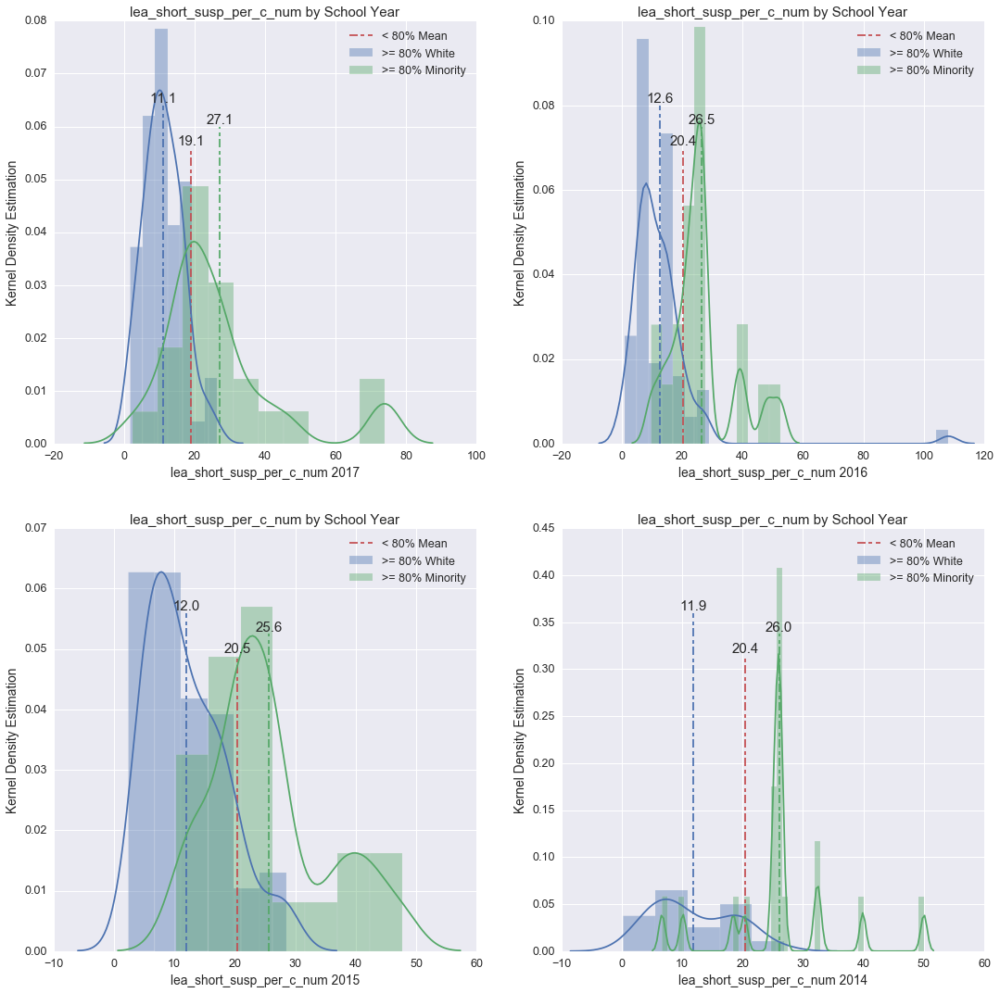

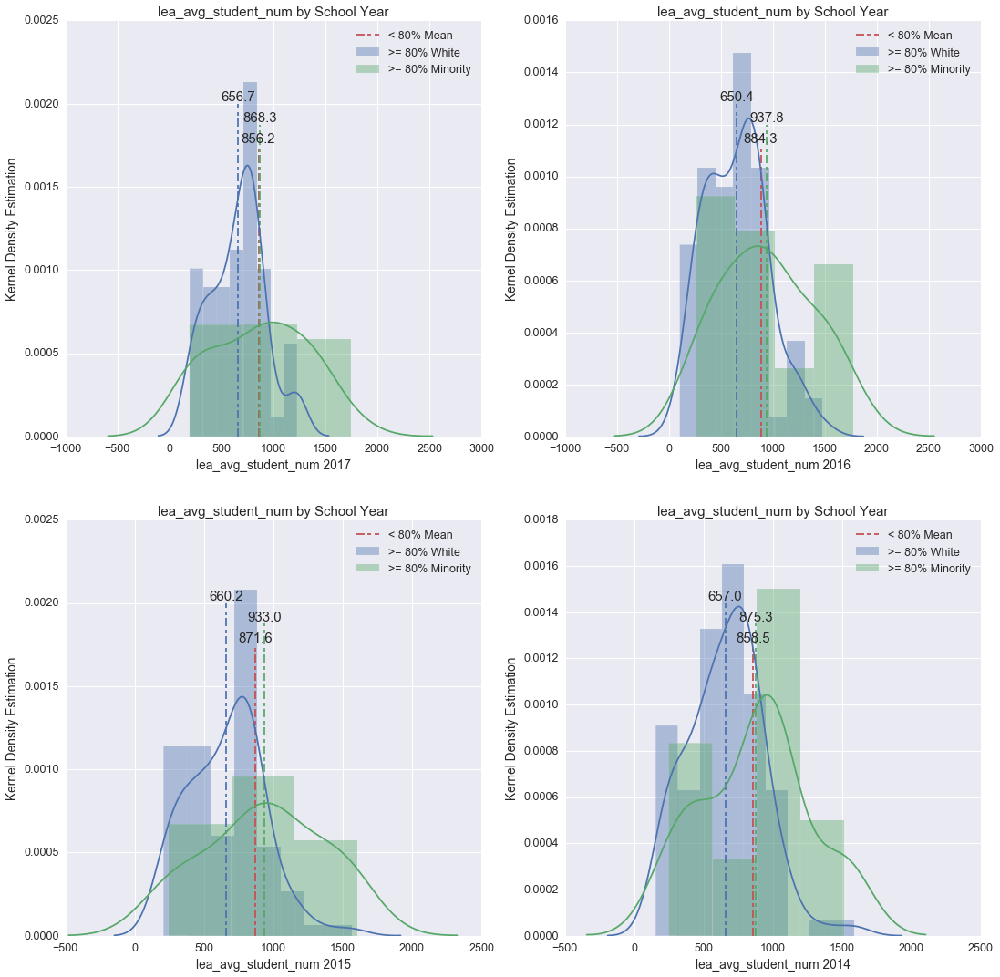

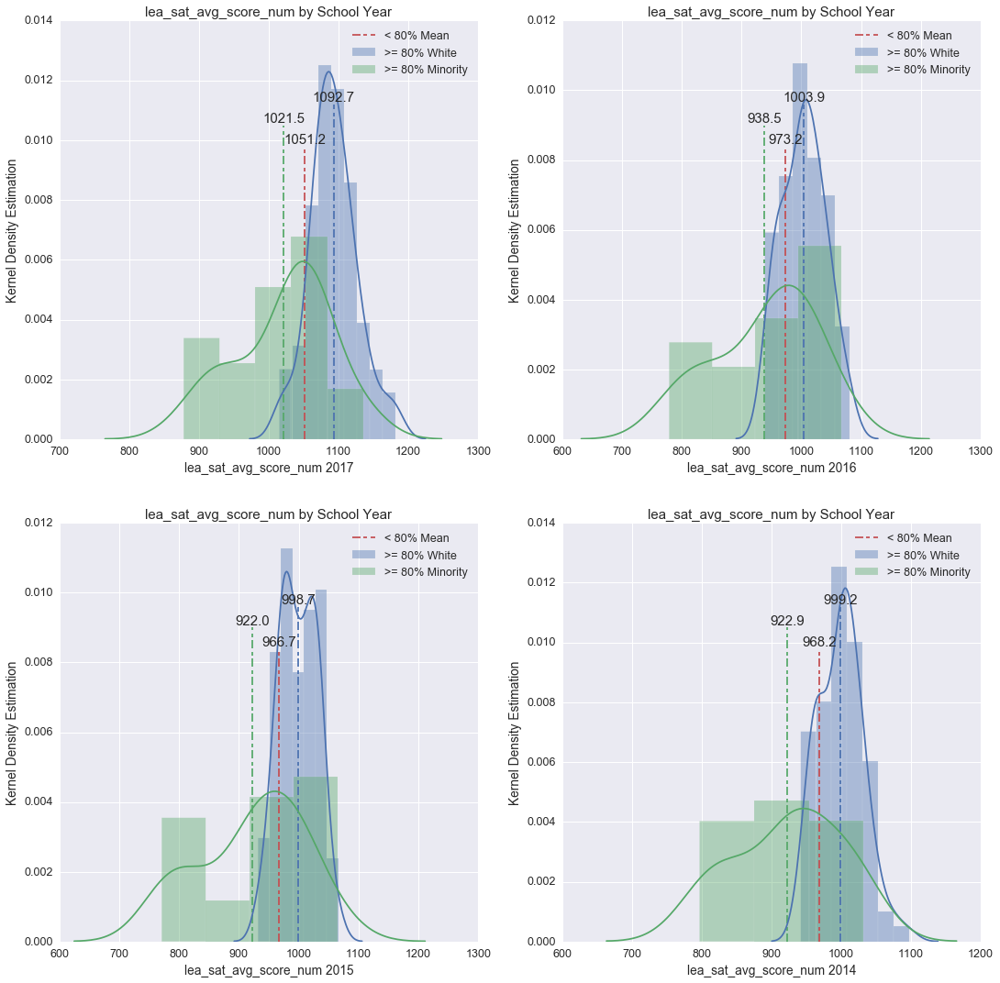

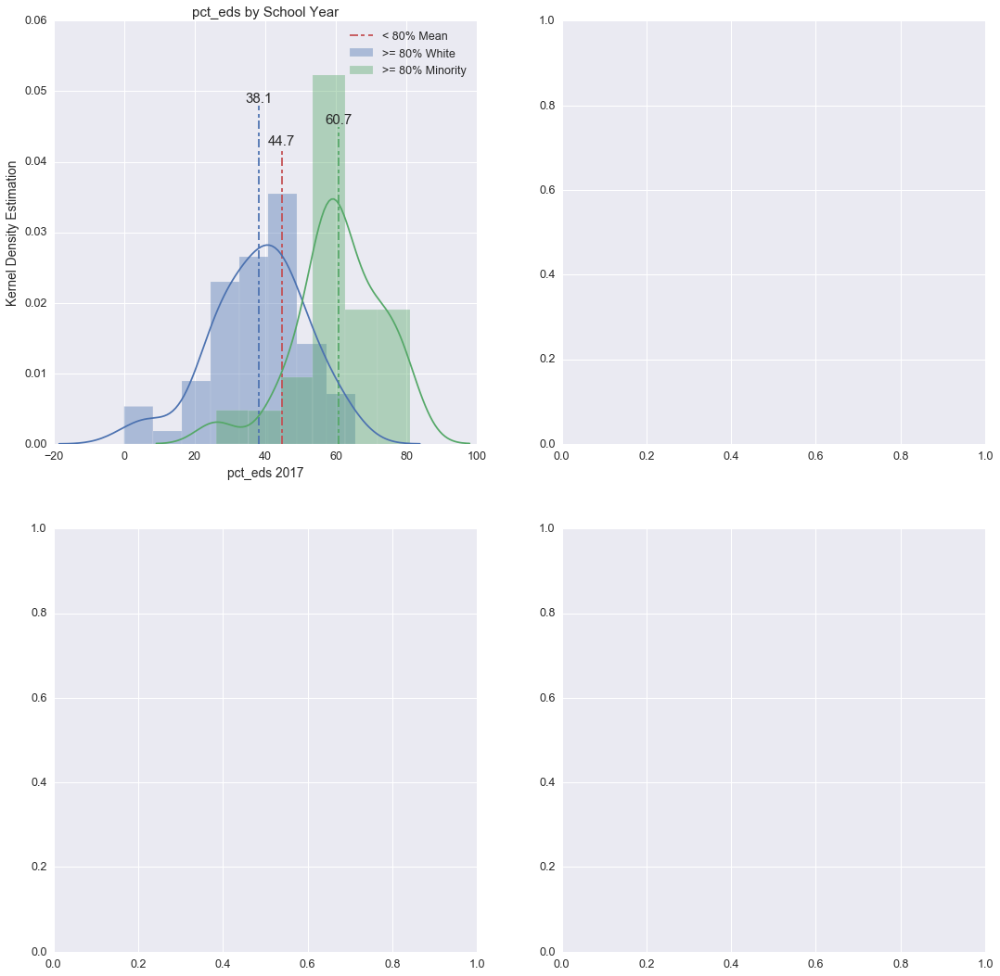

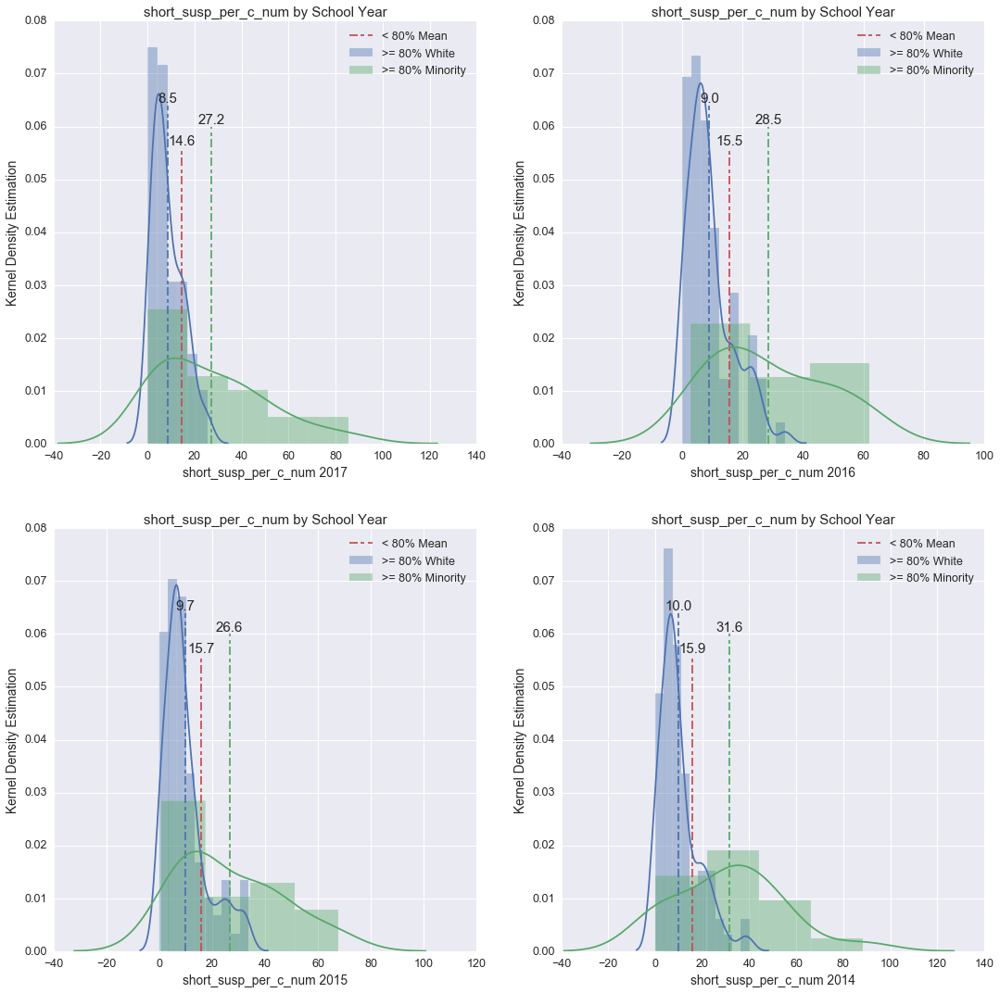

...

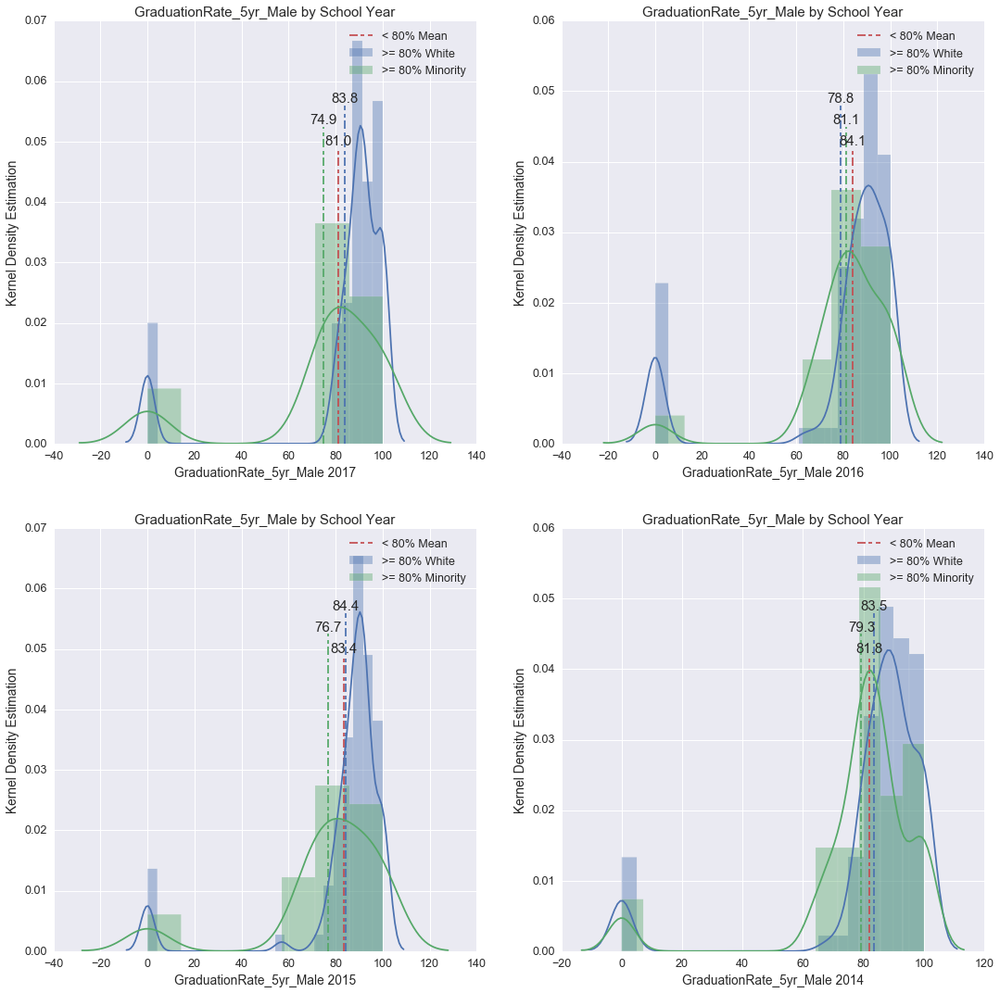

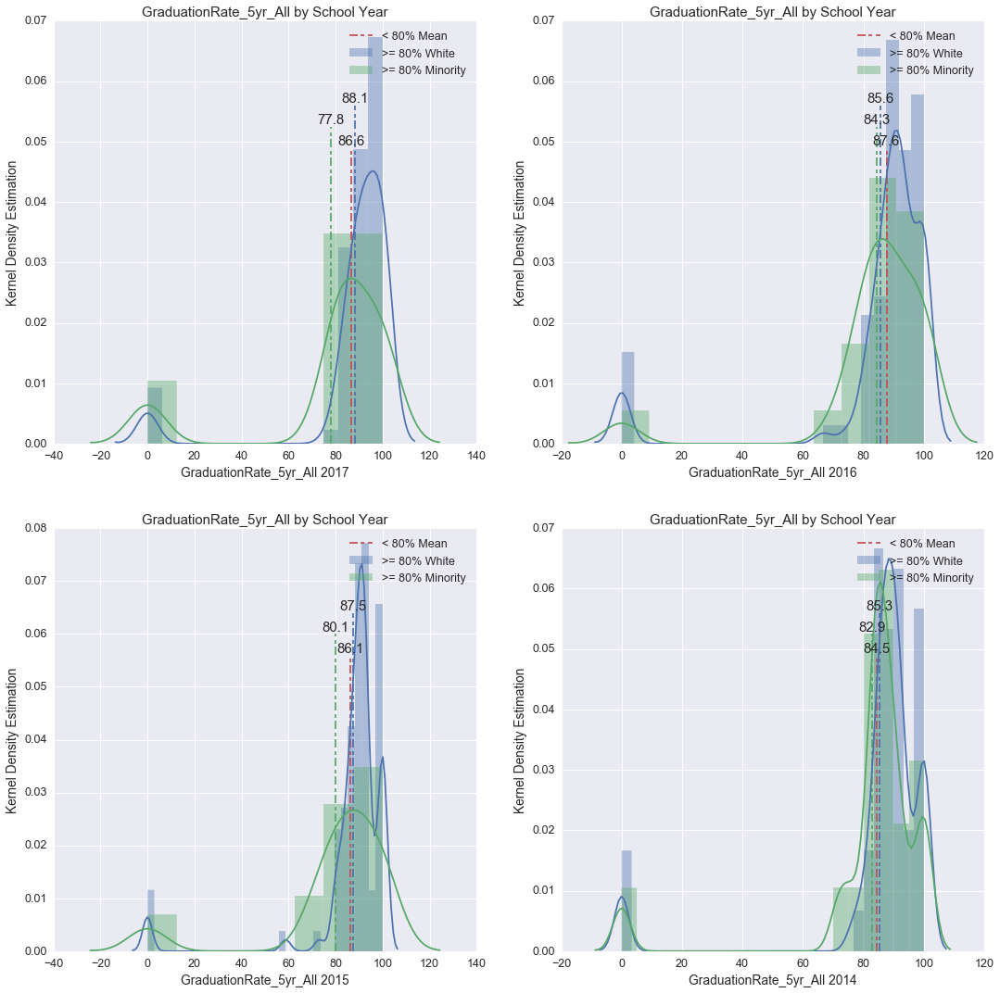

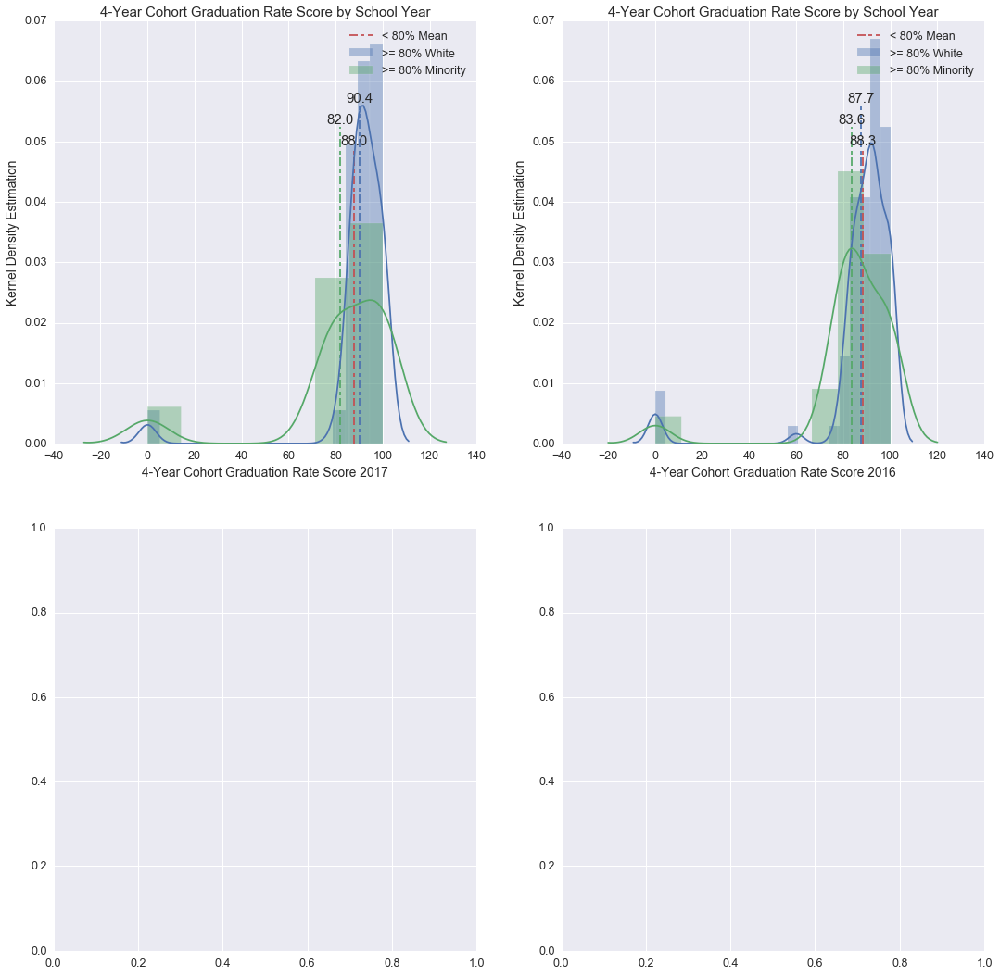

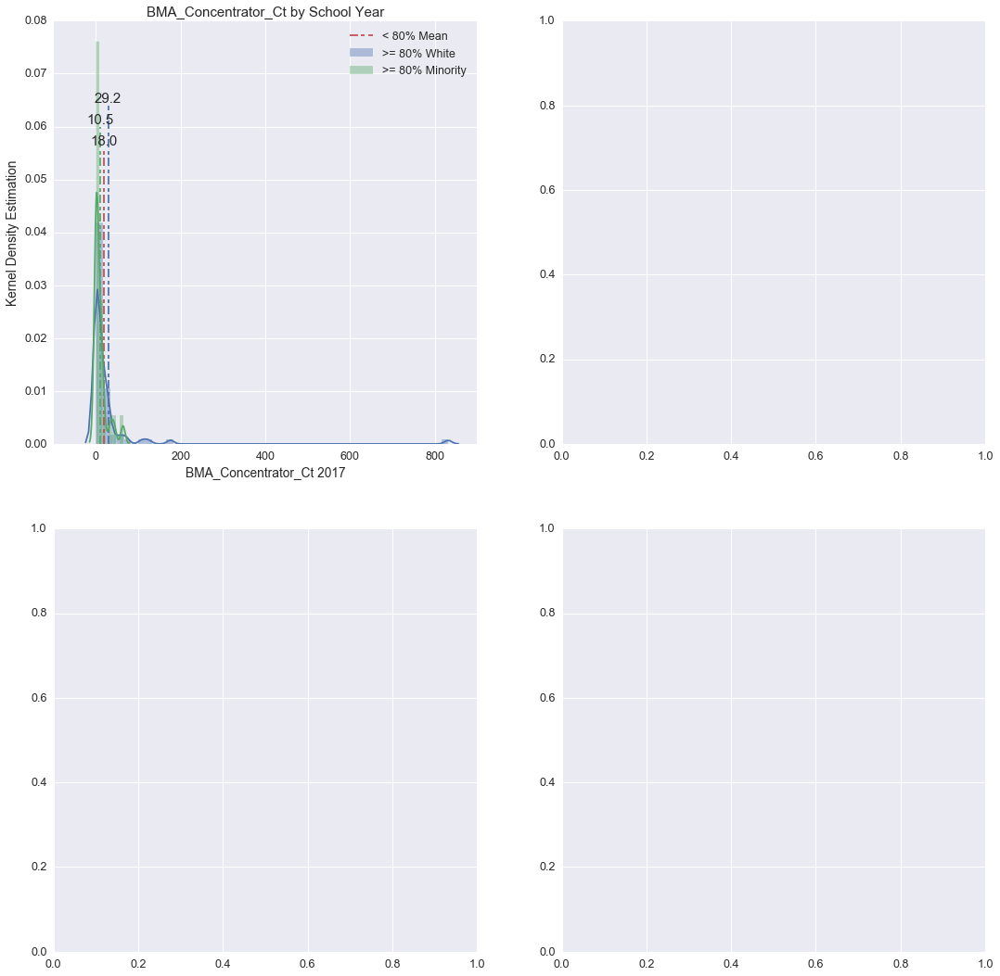

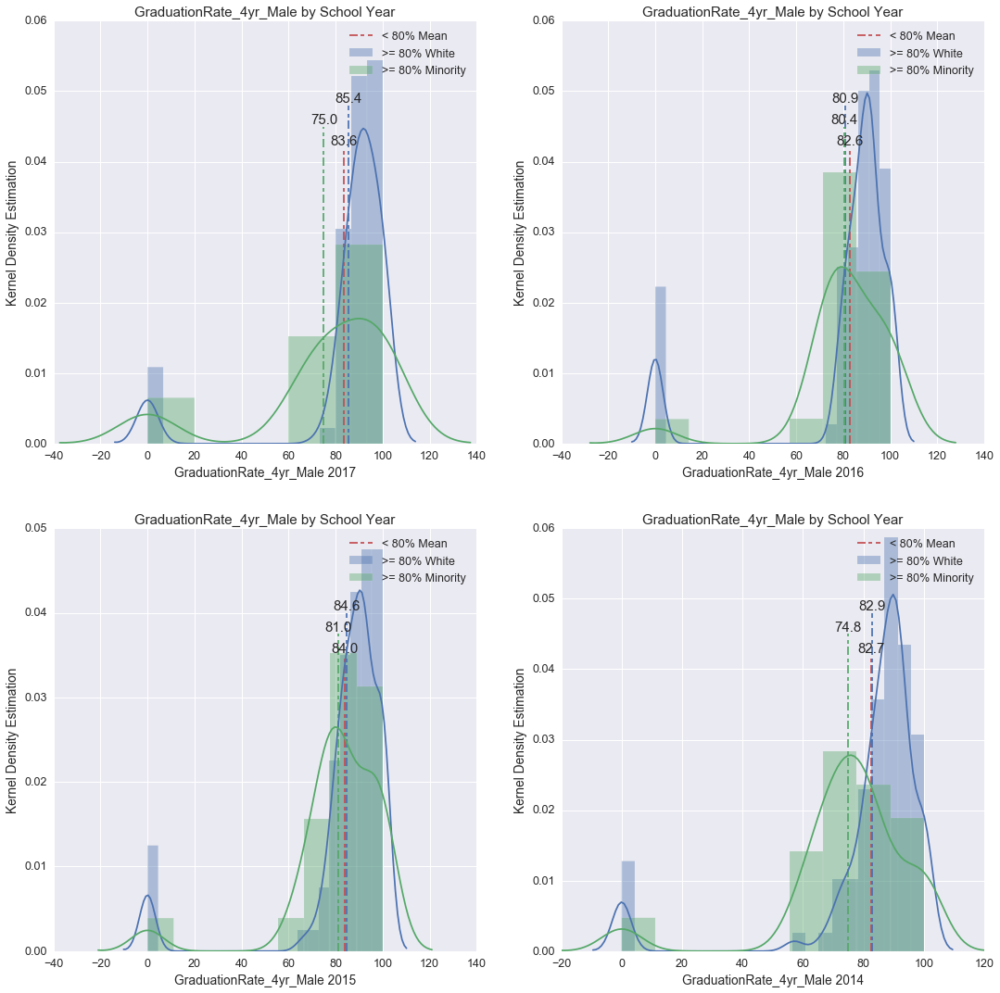

In [50]:
#Let's plot all of the important features over the past 4 years. 
datasets = [schData2017,schData2016,schData2015,schData2014]

#Plot the 75 most important model features over the past four years.
for col in wt_plt_df['feature_names']:
    PlotColumnKdeByYears(datasets, col)

## Looking at the Model's Significant Feature Trends 2014-2017 
** Here we plot four year averages for the model's top 75 most important features comparing segregated and non-segregated public school campuses: **

* Model features are ranked by the absolute value of the model's coefficients.  
* Features with the largest differences between majority and minority campuses are shown first. 
* A point plot displays population averages over the past four years. 
* Sharp changes in a line's slope or crossing lines may indicate year over year changes for a feature / population combination. 
* Vertical distance between lines indicates differences in population averages for a feature.


In [578]:
def PlotColumnTrendsByYears(col):
    
    if col not in schData2014_2017.columns:
        print "Could not chart column: " + col
    else:
        sns.set(context='notebook', style='darkgrid', font_scale=1)
        fig, ax=plt.subplots(figsize=(8,8))

        pplot = sns.pointplot(x='SchoolYear',y=col, hue='Segregated', data=schData2014_2017, ci=None)
        pplot.set_ylabel(col)
        pplot.set_xlabel("School Year")
        pplot.set_title("Segregation Trends by School Year")
        plt.show()

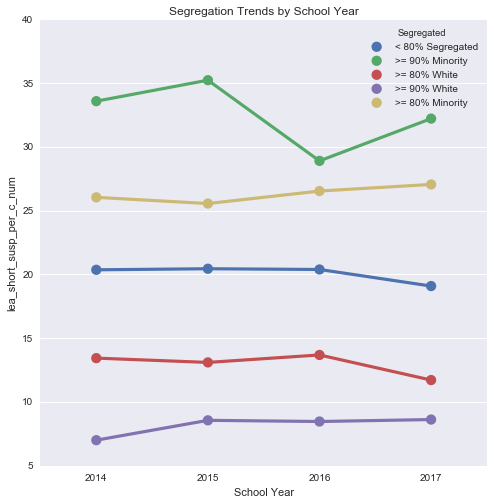

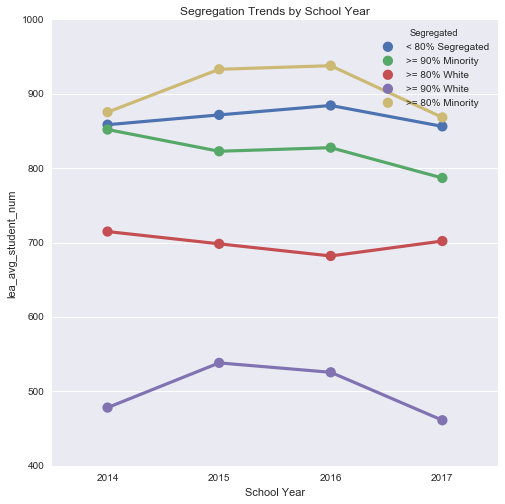

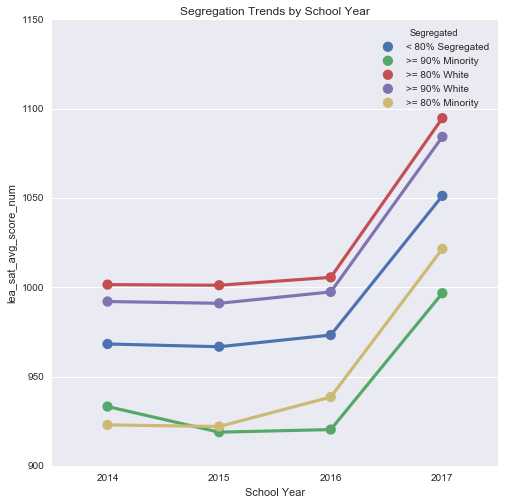

Could not chart column: pct_eds


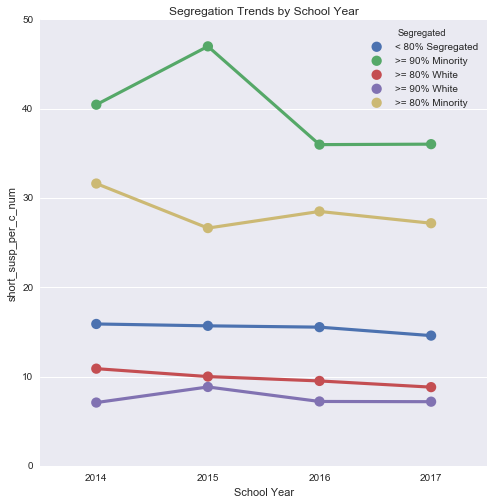

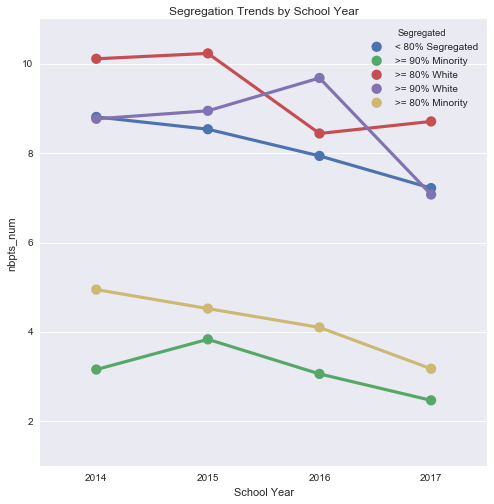

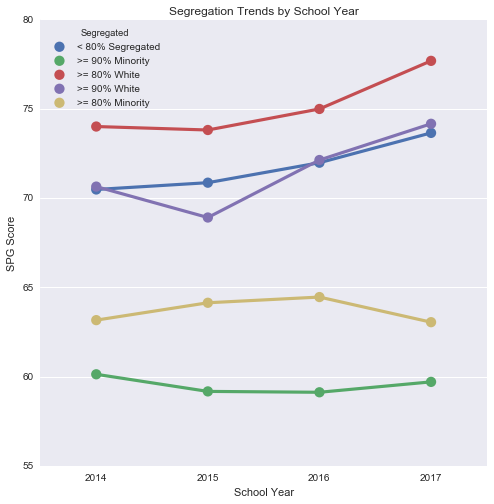

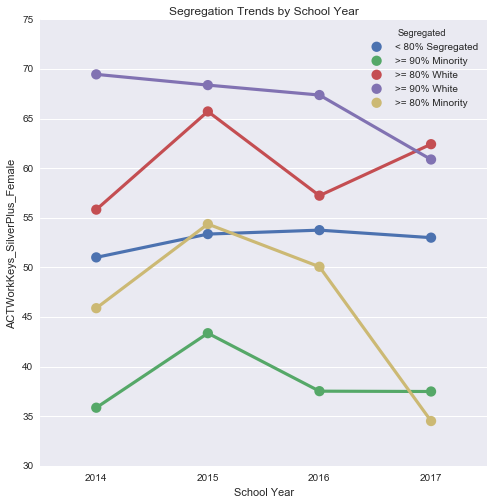

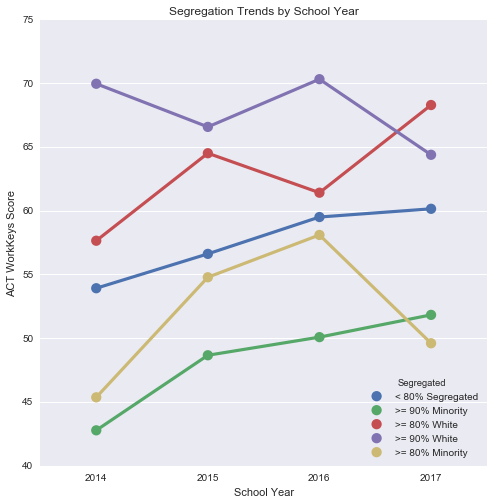

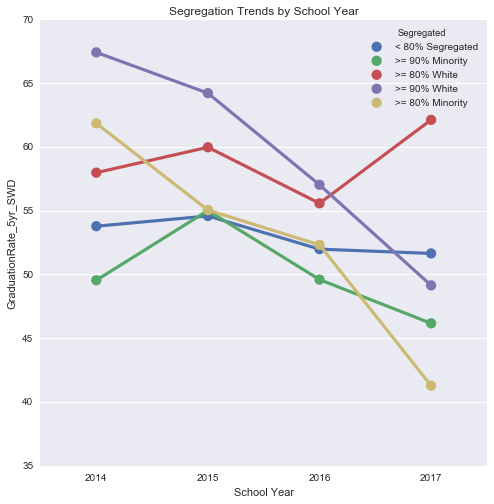

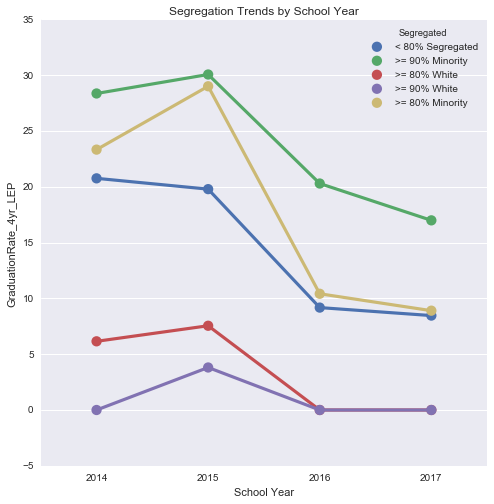

Could not chart column: Number_Industry_Recognized_Crede


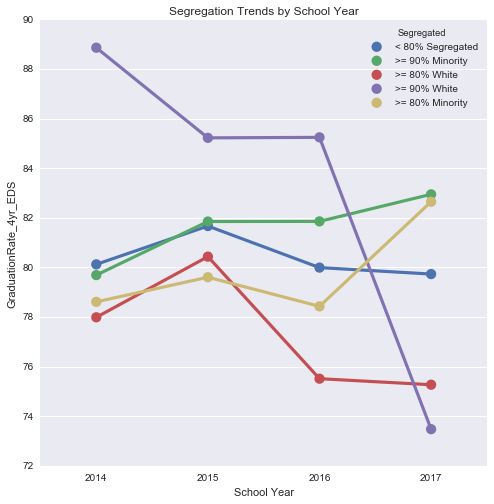

Could not chart column: ACTScience_ACTBenchmark_Female
Could not chart column: ACTReading_ACTBenchmark_Female


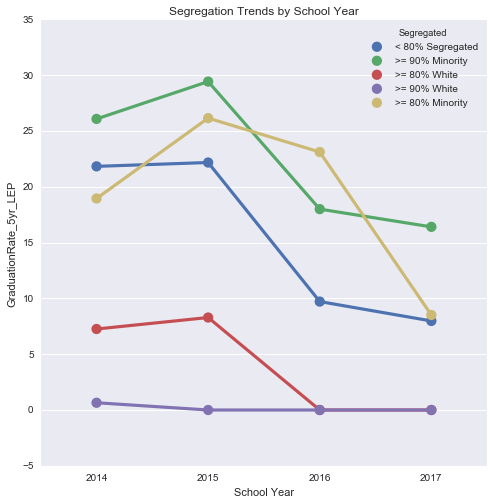

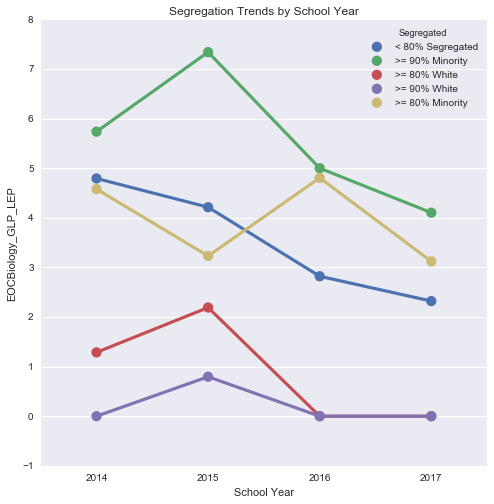

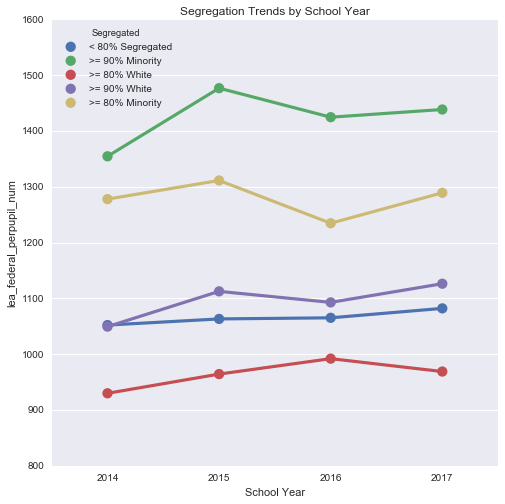

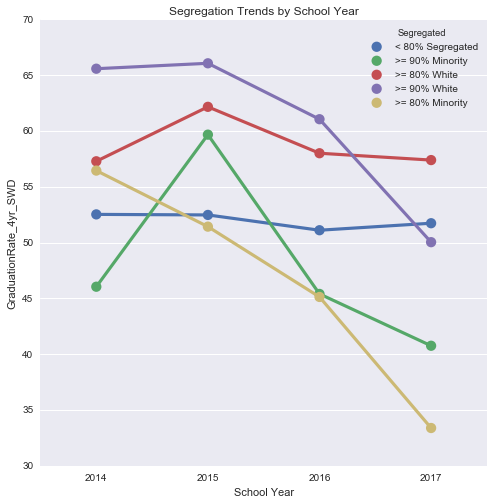

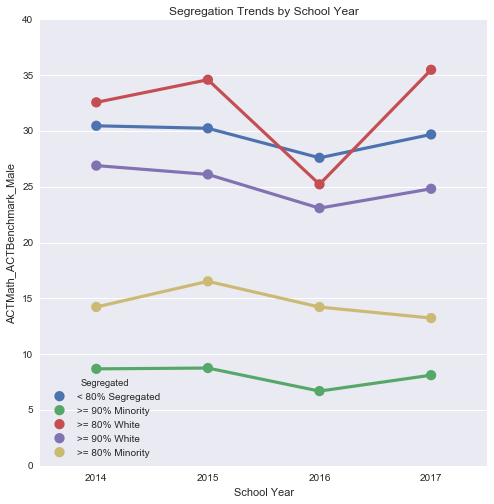

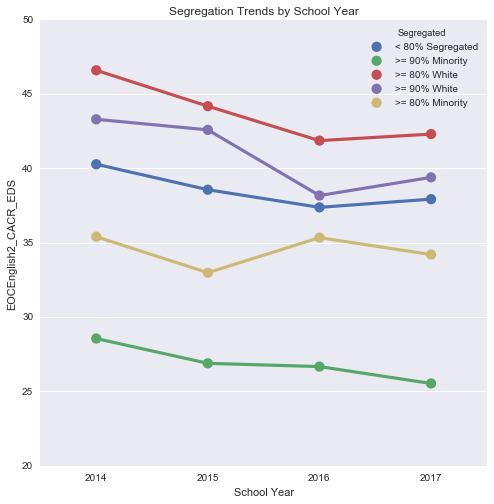

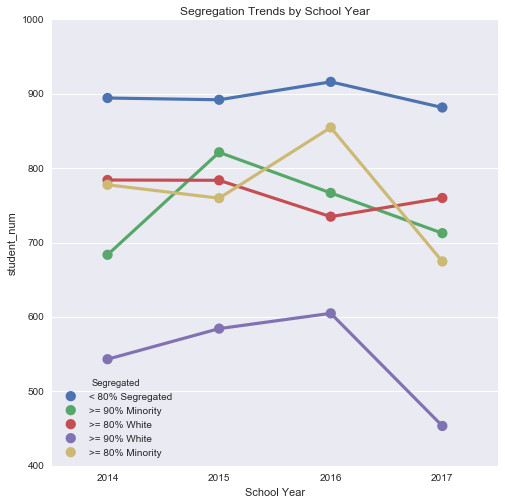

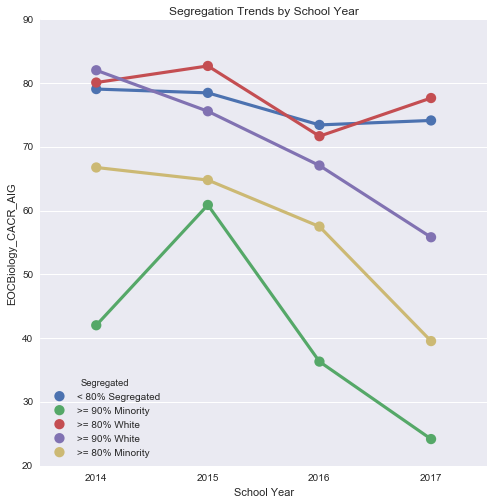

Could not chart column: 12_Size


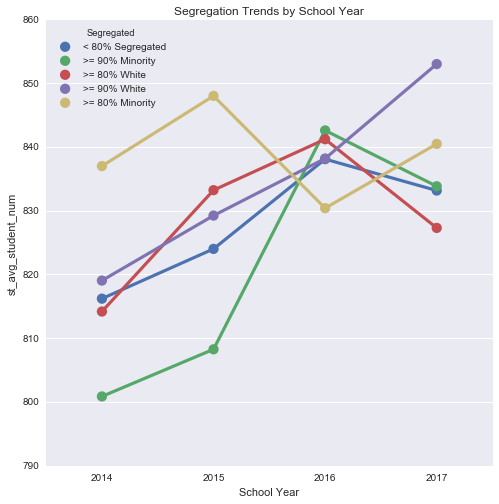

Could not chart column: AGNR_Concentrator_Ct


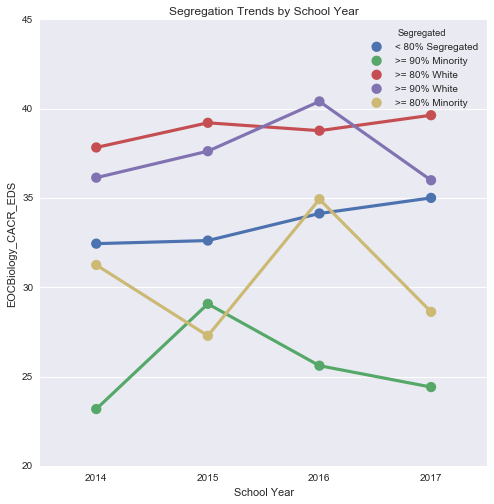

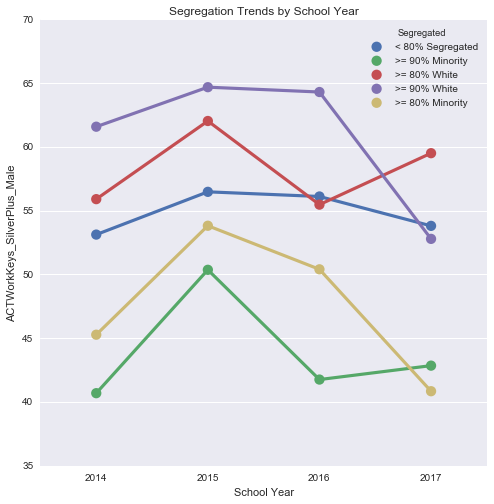

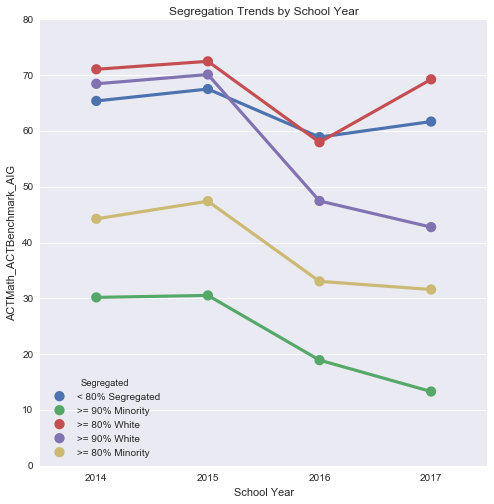

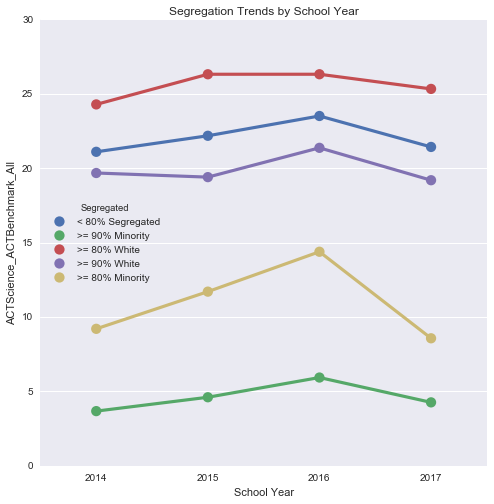

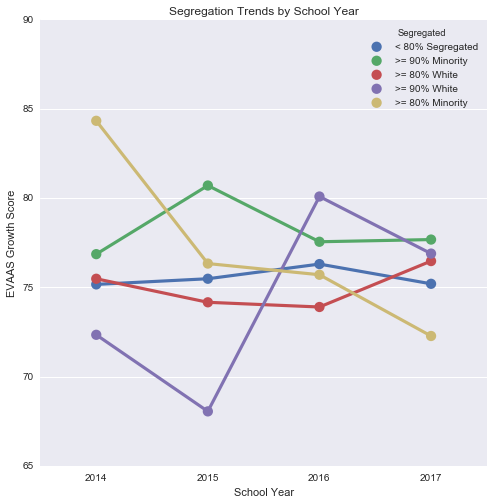

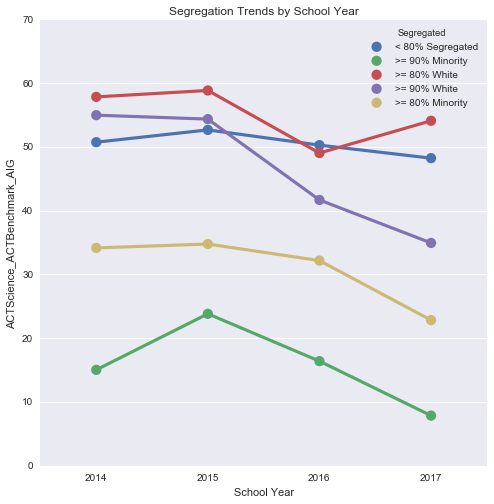

Could not chart column: MANU_Concentrator_Ct
Could not chart column: ACTWorkKeys_SilverPlus_All


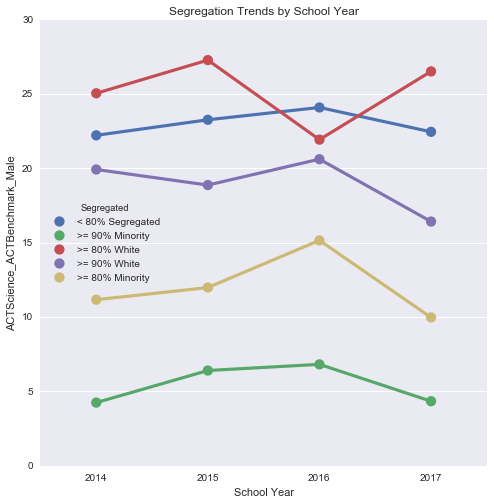

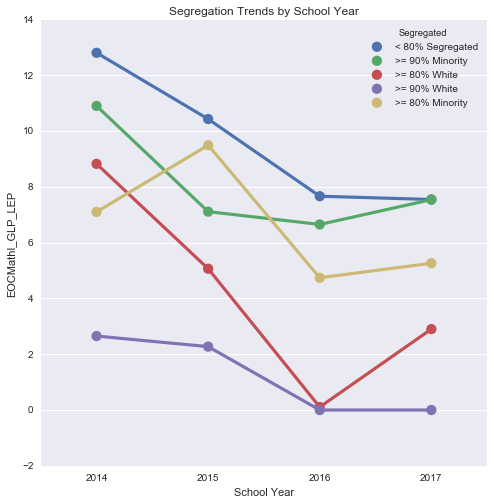

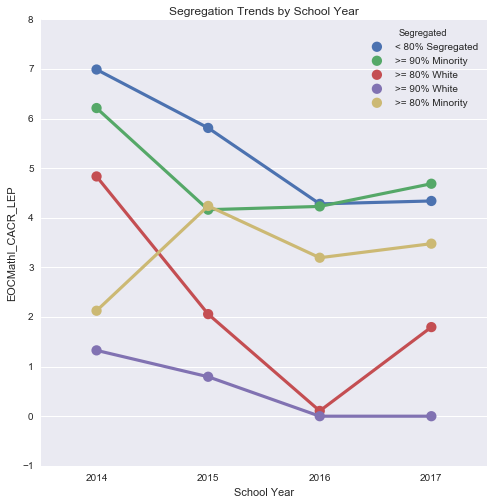

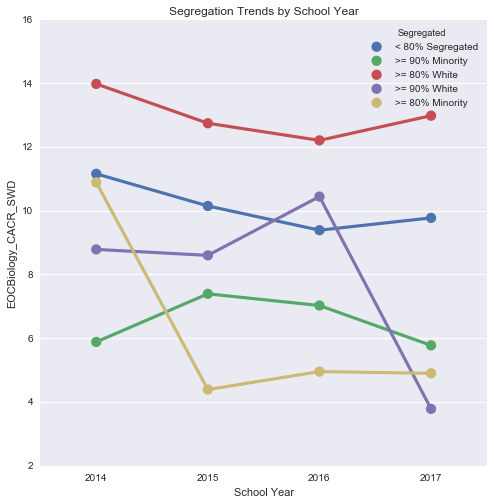

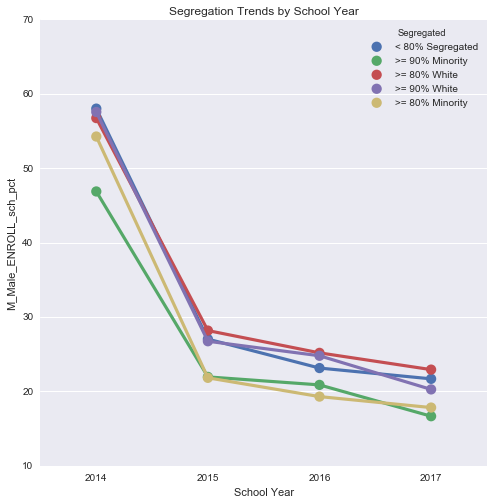

Could not chart column: ACTMath_ACTBenchmark_Female


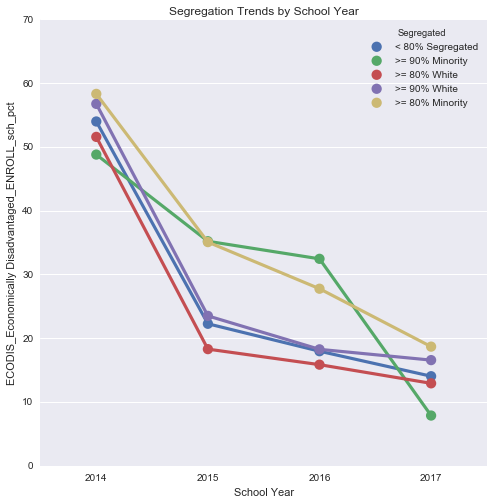

Could not chart column: ARCH_Concentrator_Ct


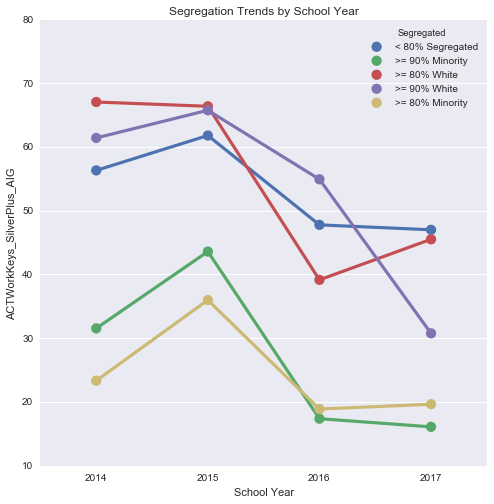

Could not chart column: avg_age_media_collection


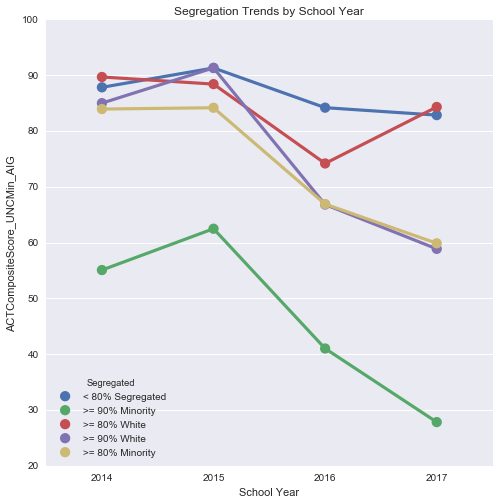

Could not chart column: wap_num


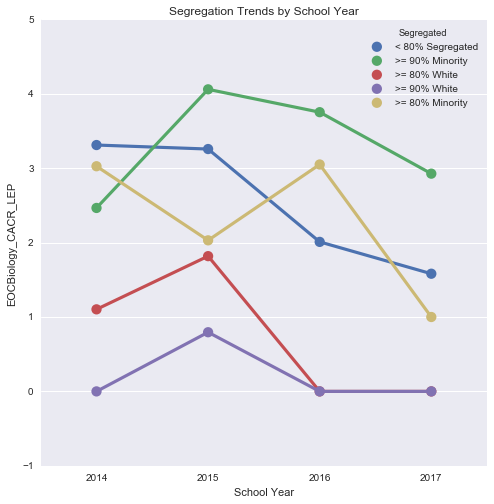

Could not chart column: Gr_9_Pct_Prof
Could not chart column: TRAN_Concentrator_Ct


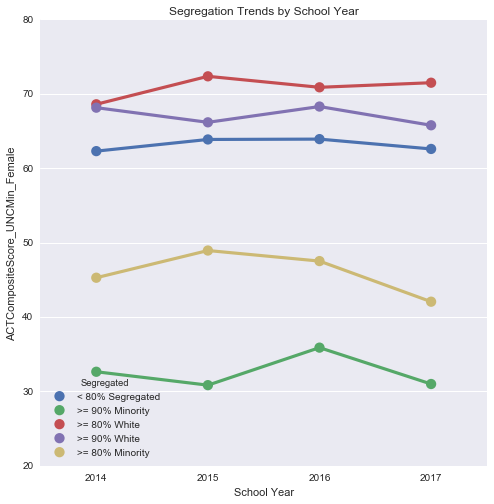

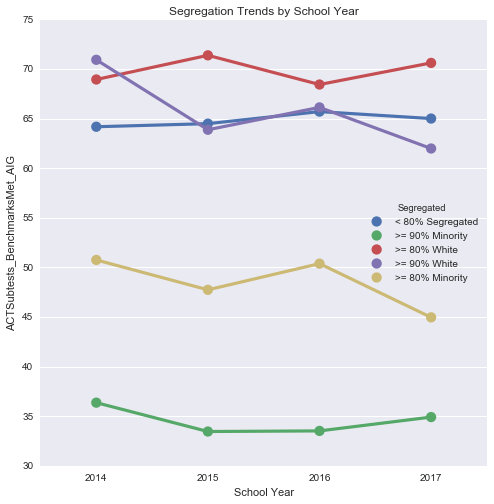

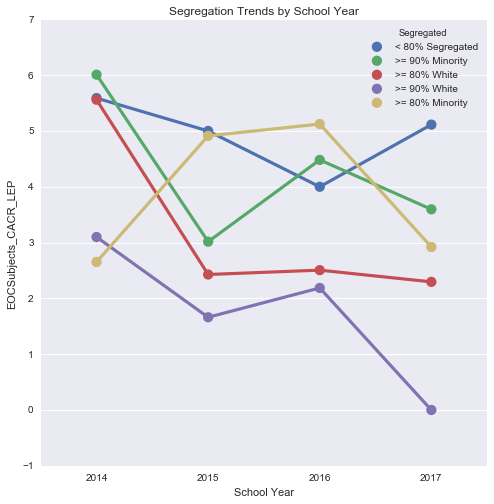

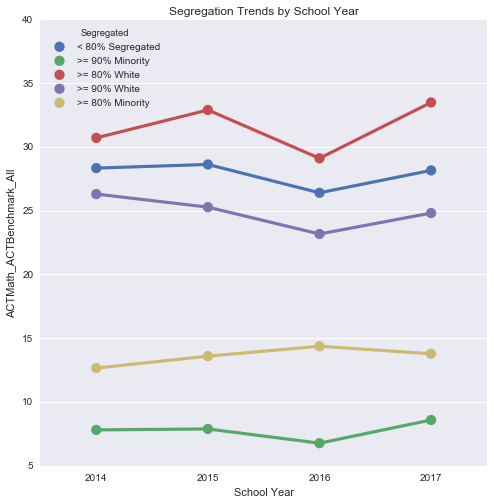

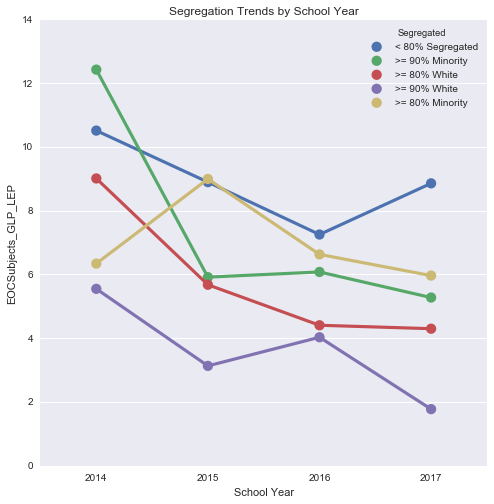

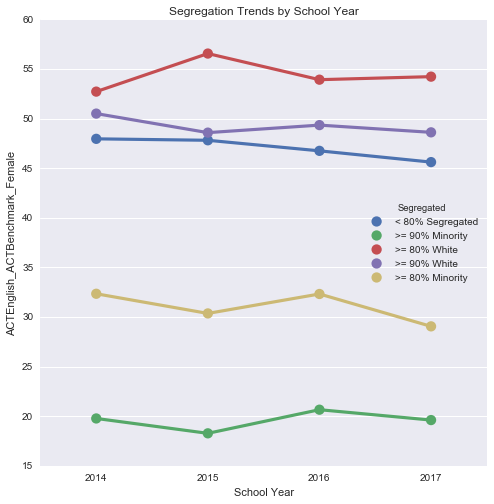

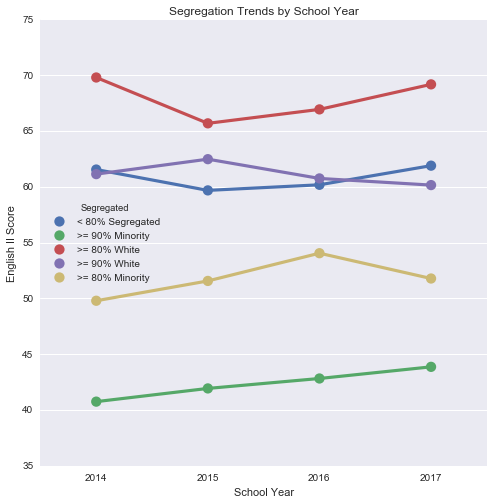

Could not chart column: Passing NC Math 3
Could not chart column: ACT Score


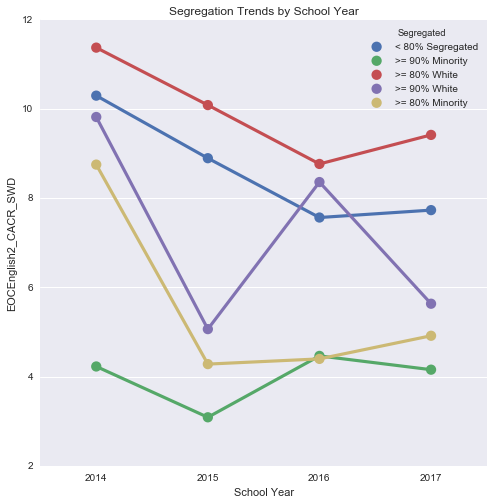

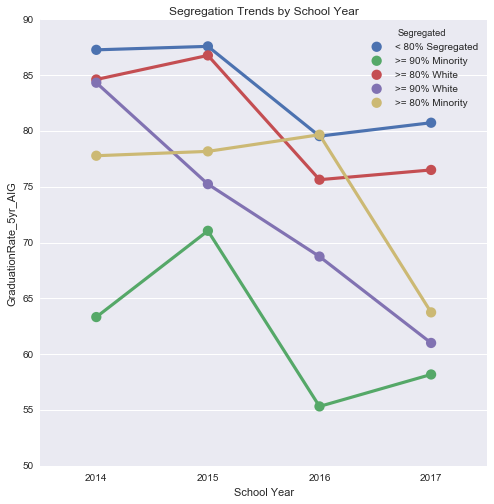

Could not chart column: EOG/EOCSubjects_GLP_LEP


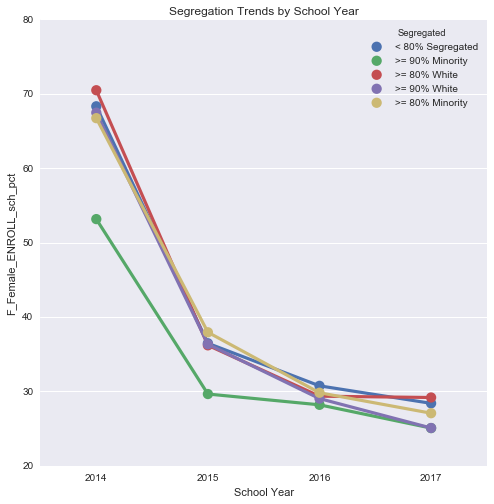

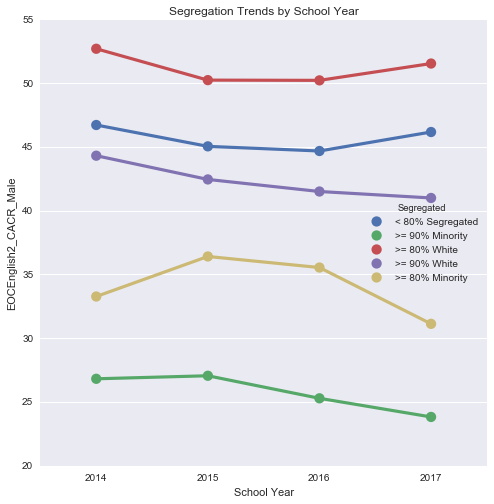

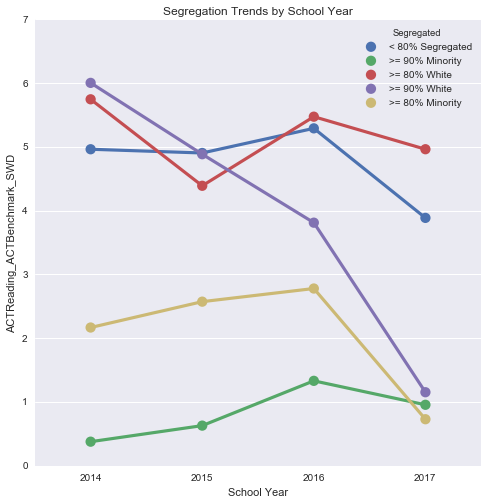

Could not chart column: HOSP_Concentrator_Ct


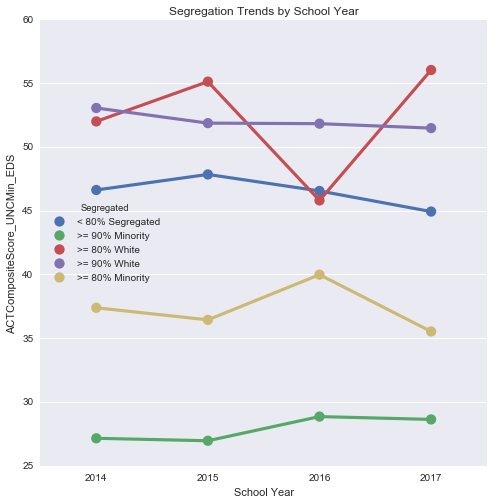

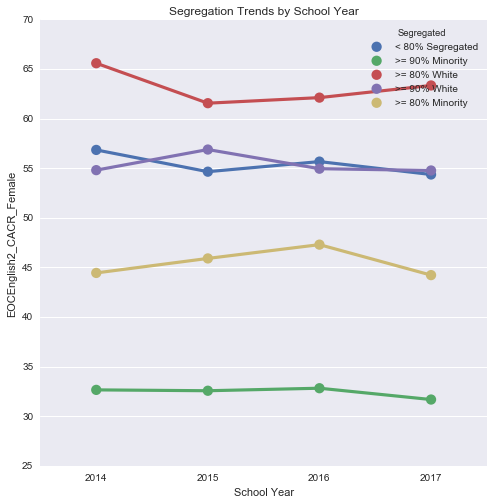

Could not chart column: AAVC_Concentrator_Ct


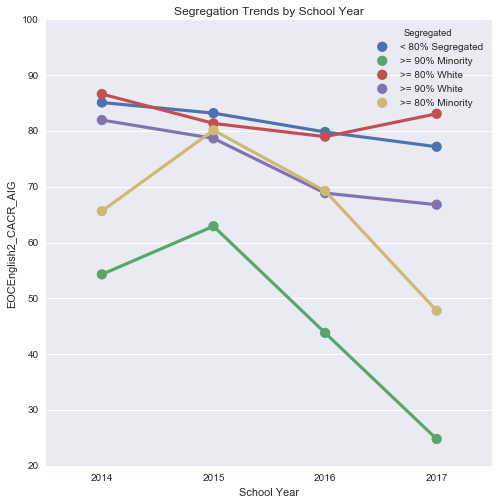

Could not chart column: INFO_Concentrator_Ct


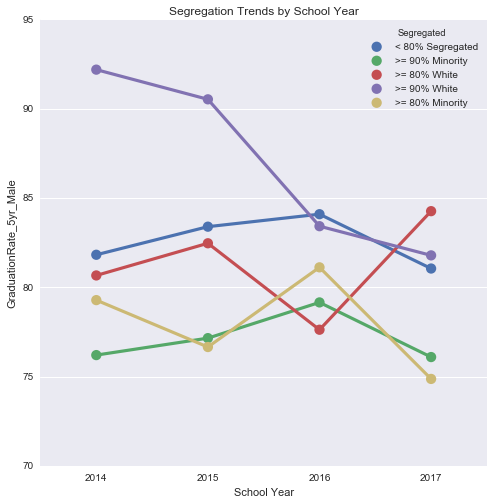

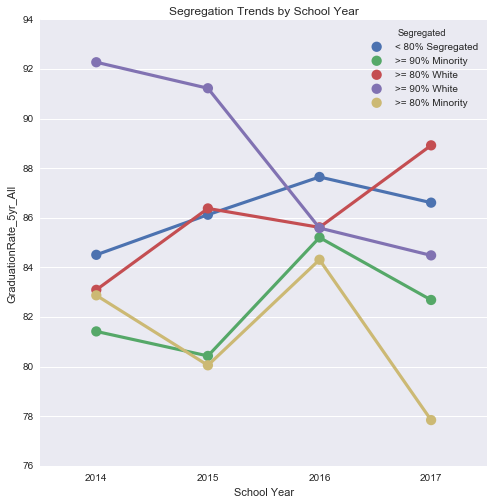

Could not chart column: 4-Year Cohort Graduation Rate Score
Could not chart column: BMA_Concentrator_Ct


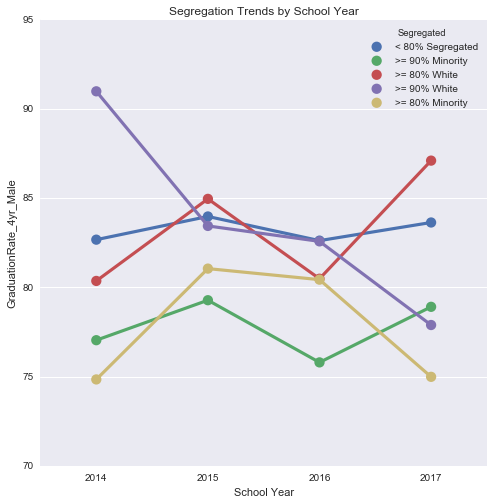

In [579]:
#Let's plot all of the important feature trends over the past 4 years. 

for col in wt_plt_df['feature_names']:        
    PlotColumnTrendsByYears(col)       